In [2]:
import scanpy as sc
import pandas as pd
# from scipy.io import mmread
import numpy as np
import scipy.sparse as sp
import os
import anndata as ad

# from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import scanpy.external as sce  # Harmony 在 sc.external
# from sklearn.decomposition import PCA

import harmonypy as hm
import warnings
warnings.simplefilter("ignore", category=pd.errors.PerformanceWarning)

In [3]:
adata = sc.read_h5ad("./adata_05a_with_embeddings.h5ad")
adata
# adata.obs = adata.obs.rename(columns={"patient": "individual"})

AnnData object with n_obs × n_vars = 49641 × 27187
    obs: 'prject', 'nUMI', 'nGene', 'cellID', 'Doublet_Score', 'Doublet_Class', 'log10GenesPerUMI', 'mitoRatio', 'riboRatio1', 'riboRatio2', 'riboRatio3', 'riboRatio4', 'riboRatio', 'RNA_snn_res.0', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'class1', 'sample', 'source', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'RNA_snn_res.1.6', 'RNA_snn_res.1.8', 'RNA_snn_res.2', 'cellType', 'dcellType', 'cell', 'patient', 'timing', 'category', 'response', 'sub.response', 'date', 'start', 'daysSinceStart', 'blast', 'age', 'sex', 'FAB', 'cellCount', 'monthsSinceStart', 'relapse', 'daysStartRelapse', 'monthsStartRelapse', 'azimuthNames', 'mut', 'p53.mut', 'n_counts', 'venetoclax', 'treat'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.varianc

In [4]:
from sklearn.metrics import adjusted_rand_score
adata_ctrl = adata[adata.obs["patient"].isin(["HCBM1","HCBM2","HCBM3"])].copy()
# adata_aml = adata[~adata.obs["patient"].isin(["HCBM1","HCBM2","HCBM3"])].copy()


In [5]:

# adata = ad.read_h5ad("./content/input_data/abdu_noHC_noribo.h5ad")
# adata = ad.read_h5ad("./content/input_data/03a-aml-BM.h5ad")
model = "V1-10M"
embeddings = pd.read_csv(f"./content/embs/{model}/cm_finetuned_embs.csv",index_col=0).values
print(embeddings.shape, adata_ctrl.n_obs)

adata_ctrl.obsm[f"X_FTHCembedding_{model}"] = embeddings[:,:-2]

adata_ctrl.obsm["X_FTHCembedding_V1-10M"] = np.array(
    adata_ctrl.obsm["X_FTHCembedding_V1-10M"].tolist(),  # list 转标准 array
    dtype=np.float32
)

(22681, 256) 22681


In [6]:
hierarchical_markers = {
    "CD4": {
        # "general": ["CD4", "IL7R", "MAL", "LEF1", "LTB", "LDHB", "TPT1", "TRAC", "TCF7", "TMSB10", "LEPROTL1","CD3D", "CD3E","CD3G", "CD27"],   # broad CD4 T cell markers
         "general": ["CD4", "IL7R", "MAL", "LTB"],   # broad CD4 T cell markers
        "subtypes": {
            "CD4 Memory T cells": ["CXCR3", "IL7R", "LTB"],
            "CD4 Naive T cells": ["LEF1","TCF7","SELL","CD44"], #Naive "IL7R", "LTB"
            "CD4 CTL T cells": ["GZMB","PRF1","GNLY","NKG7"],
            "CD4 Exhausted T cells": ["CTLA4","LAG3","TIGIT","HAVCR2","PDCD1"],
            "CD4 Th1 T cells": ["TBX21","STAT4","IFNG","IL12A"],
            "CD4 Th2 T cells": ["STAT6","GATA6","IL4"],
            "CD4 Th17 T cells": ["IL7RA","STAT3","RORC"],
            "CD4 Tfh T cells": ["BCL6","CXCR5"],
            "Treg": ["TGFB1","FOXP3","IL2RA","IKZF2"]
        }
    },
    "CD8": {
        # "general": ["CD8A","CD8B","NELL2", "CD3D", "CD3E", "S100B", "GZMH", "CD3G", "TRGC2", "CCL5"],
        "general": ["CD8A","CD8B", "CD3D" ],
        "subtypes": {
            "CD8 Naive T cells": ["NELL2","CD8B","CCR7","LEF1","SELL","IL7R"],
            "CD8 Effector Memory T cells": ["PRF1","FGFBP2","FCGR3A","KLRD1","NKG7","KLRG1","CX3CR1"],
            "CD8 Exhausted T cells": ["CTLA4","LAG3","TIGIT","PDCD1","TOX"],
            "CD8 CTL T cells": ["GZMB","PRF1","GNLY","NKG7","GZMA"],
            "MAIT": ["KLRB1","IL7R","SLC4A10","RORC"]
        }
    },
    # "B": {
    #     "general": ["FCRL1", "FCRL2", "CD22", "ARHGAP24", #Azimuth
    #                                                            "BANK1", "MS4A1", "RALGPS2", "CD37",
    #                                                            "SWAP70", "CD79A",
    #                                                            "CD19", "B220"],#Abbas Lab
    #     "subtypes": {}
    # },
    "B": {
        "general": ["MS4A1", "CD79A", "CD79B", "BANK1", "RALGPS2"],
        "subtypes": {
            "B intermediate": ["MS4A1", "TNFRSF13B", "IGHM", "IGHD", "AIM2", "CD79A", "LINC01857", "RALGPS2", "BANK1", "CD79B"],
            "B memory": ["MS4A1", "COCH", "AIM2", "BANK1", "SSPN", "CD79A", "TEX9", "RALGPS2", "TNFRSF13C", "LINC01781"],
            "B naive": ["IGHM", "IGHD", "CD79A", "IL4R", "MS4A1", "CXCR4", "BTG1", "TCL1A", "CD79B", "YBX3"],
            "Plasmablast": ["IGHA2", "MZB1", "TNFRSF17", "DERL3", "TXNDC5", "TNFRSF13B", "POU2AF1", "CPNE5", "HRASLS2", "NT5DC2"]
        }
    },

    "pre B": {
        "general": ["NPY", "LCN6", "RAG2", "HMHB1",
                                                               "ARPP21", "AKAP12", "RAG1", "C10orf10",
                                                               "CYGB", "SLC8A1-AS1"],#Abbas Lab
        "subtypes": {}
    },

    # ---- Myeloid / Mono / Macrophage ----
    "Mono": {
        "general": ["LYPD2", "FOLR3", "CLEC4E", "LILRA1",
                    "CDA", "RBP7", "CD300LF", "FPR1", "CD93", "MTMR11"],
        "subtypes": {
            "CD14 Mono": ["FOLR3", "CLEC4E", "MCEMP1", "RBP7",
                          "CDA", "FPR1", "CD300E", "C5AR1",
                          "CD93", "APOBEC3A"],
            "CD16 Mono": ["LYPD2", "VMO1", "TPPP3", "C1QA",
                          "C5AR1", "CD300E", "GPBAR1", "LILRA1",
                          "HES4", "APOBEC3A"]
        }
    },
    # ===== NK lineage =====
    "NK": {
        "general": ["TRDC", "FCER1G", 
                    "KLRF1" 
                    ],
        # "general": ["NKG7", "KLRC1", "KLRD1", "KLRB1", 
        #                                                        "KIR2DL1", "KIR3DL1", "KIR2DL3", "KIR3DL2",
        #                                                        "KIR3DL3", "GNLY", "NCAM1", "FCGR3A"],
        "subtypes": {
            "NK CD56-dim": ["GNLY", "TYROBP", "NKG7", "GZMB",  "PRF1", "FGFBP2", "SPON2"],
            "NK Proliferating": ["MKI67" , "TYMS",  "TOP2A", "PCLAF", "CD247", "CLSPN", "ASPM"],
            "NK CD56-bright": ["XCL2",  "SPINK2", "KLRC1", "XCL1", "SPTSSB", "PPP1R9A", "NCAM1", "TNFRSF11A"]
        }
    },
    "EMPs": {
        "general": ["MYCT1", "CRHBP", "NPR3", "AVP", "HPGDS", "CRYGD","IGSF10", "PBX1", 
                    "CYTL1","GATA2"
                    ],
        "subtypes": {}
    },

    # ---- DC ----
    "DC": {
        "general": ["CLEC4C", "PROC", "SCT", "SCN9A",
                    "SHD", "PPM1J", "ENHO", "CLEC10A",
                    "LILRA4", "DNASE1L3"],
        "subtypes": {
            'ASDC':['PPP1R14A', 'LILRA4', 'AXL', 'IL3RA', 'SCT', 'SCN9A', 'LGMN', 'DNASE1L3', 'CLEC4C', 'GAS6'],
            'cDC1':['CLEC9A', 'DNASE1L3', 'C1orf54', 'IDO1', 'CLNK', 'CADM1', 'FLT3', 'ENPP1', 'XCR1', 'NDRG2'],
            'cDC2':['FCER1A', 'HLA-DQA1', 'CLEC10A', 'CD1C', 'ENHO', 'PLD4', 'GSN', 'SLC38A1', 'NDRG2', 'AFF3'],
            'pDC':['ITM2C', 'PLD4', 'SERPINF1', 'LILRA4', 'IL3RA', 'TPM2', 'MZB1', 'SPIB', 'IRF4', 'SMPD3']
        }
    },

    # ---- Progenitors / Stem cells ----
    "HSC": {
        "general": ["CD34", "AVP", "CRHBP"],
        "subtypes": {}
    },
    "CLP": {
        "general": ["ACY3", "PRSS2", "C1QTNF4", "SPINK2",
                    "SMIM24", "NREP", "CD34", "DNTT", "FLT3", "SPNS3"],
        "subtypes": {}
    },
    "GMP": {
        "general": ["SERPINB10", "RNASE3", "MS4A3", "PRTN3",
                    "ELANE", "AZU1", "CTSG", "RNASE2", "RETN", "NPW"],
        "subtypes": {}
    },

    # ---- Erythroid / Megakaryocyte ----
    # "Early Erythroid": {
    #     "general": [
    #         "CNRIP1",  "ITGA2B", "TFR2", "MAP7", "FSCN1", "APOC1" "GATA1", "KLF1", 
    #                 "CYTL1","GATA2",
    #                 ],
    #     "subtypes": {}
    # },
    # "Late Erythroid": {
    #     "general": ["CTSE", "TSPO2", "IFIT1B", "TMEM56",
    #                            "RHCE", "RHAG", "SPTA1", "ADD2",
    #                            "EPCAM", "HBG1"],
    #     "subtypes": {}
    # },
    "Macrophage": {
        "general": ["SPIC", "FABP3", "CD5L", "CCL18",
                    "C1QC", "C1QB", "FABP4", "C1QA",
                    "APOE", "SELENOP"],
        "subtypes": {}
    },
    "Erythroid": {
        "general": ['HBD', 'HBM', 'AHSP', 'ALAS2','CA1', 'SLC4A1', 'IFIT1B', 'TRIM58', 'SELENBP1', 'TMCC2'],
        "subtypes": {
            "Early Erythroid": ["CNRIP1", "GATA2", "ITGA2B", "TFR2",
                                "GATA1", "KLF1", "CYTL1", "MAP7",
                                "FSCN1", "APOC1"],
            "Late Erythroid": ["CTSE", "TSPO2", "IFIT1B", "TMEM56",
                               "RHCE", "RHAG", "SPTA1", "ADD2",
                               "EPCAM", "HBG1"]
        }
    },
    "Platelets": {
        "general": ["RGS18", "C2orf88", "TMEM40", "GP9",
                    "PF4", "PPBP", "DAB2", "SPARC",
                    "RUFY1", "F13A1"],
        "subtypes": {}
    }
}

In [7]:
celltype_colors_dict = {
    # ---- CD4 T ----
    "CD4": "#8dd3c7",
    "CD4 Memory T cells": "#66c2a5",
    "CD4 Naive T cells": "#99d8c9",
    "CD4 CTL T cells": "#41ae76",
    "CD4 Exhausted T cells": "#238b45",
    "CD4 Th1 T cells": "#005824",
    "CD4 Th2 T cells": "#b2e2e2",
    "CD4 Th17 T cells": "#7bccc4",
    "CD4 Tfh T cells": "#2ca25f",
    "Treg": "#006d2c",

    # ---- CD8 T ----
    "CD8": "#fb8072",
    "CD8 Naive T cells": "#fdbb84",
    "CD8 Effector Memory T cells": "#e34a33",
    "CD8 Exhausted T cells": "#b30000",
    "CD8 CTL T cells": "#f16913",
    "MAIT": "#fb6a4a",

    # ---- B cells ----
    "B": "#80b1d3",
    "B intermediate": "#4eb3d3",
    "B memory": "#2b8cbe",
    "B naive": "#7fcdbb",
    "Plasmablast": "#1c9099",

    # ---- pre B ----
    "pre B": "#08306b",

    # ---- Monocytes ----
    "Mono": "#bebada",
    "CD14 Mono": "#9e9ac8",
    "CD16 Mono": "#756bb1",

    # ---- NK ----
    "NK": "#fccde5",
    "NK CD56-dim": "#fa9fb5",
    "NK Proliferating": "#dd3497",
    "NK CD56-bright": "#980043",

    # ---- EMPs ----
    "EMPs": "#fdb462",

    # ---- DC ----
    "DC": "#b3de69",
    "ASDC": "#66c2a5",
    "cDC1": "#31a354",
    "cDC2": "#006d2c",
    "pDC": "#b2df8a",

    # ---- Progenitors / Stem cells ----
    "HSC": "#bc80bd",
    "CLP": "#8c6bb1",
    "GMP": "#88419d",

    # ---- Macrophage ----
    "Macrophage": "#ffed6f",

    # ---- Erythroid ----
    "Erythroid": "#d9d9d9",
    "Early Erythroid": "#bdbdbd",
    "Late Erythroid": "#969696",

    # ---- Platelets ----
    "Platelets": "#a6cee3",

    # ---- Default ----
    "Unknown": "#999999"
}

# plt.figure(figsize=(8, 12))
# plt.axis("off")
# patches = [mpatches.Patch(color=color, label=ctype) for ctype, color in celltype_colors_dict.items()]

# plt.legend(
#     handles=patches,
#     loc='center left',
#     bbox_to_anchor=(0, 0, 1, 1),  # 左对齐，居中
#     ncol=2,                       # 分两列显示
#     fontsize=9,
#     title="Cell Type Color Legend",
#     title_fontsize=11,
#     frameon=False
# )

# plt.tight_layout()
# plt.show()
# plt.savefig("celltype_color_legend.png", dpi=300, bbox_inches="tight")


In [20]:
def main_cluster(adata_filter,basis, n_neighbors, resolution,threshold_main,threshold_sub,celltype_colors_dict):
    for key in ['X_harmony', 'X_pca', 'X_tsne', 'X_pca_harmony', 'X_umap']:
        adata_filter.obsm.pop(key, None)

    # Z = adata_filter.obsm[basis]
    # Z = Z.toarray() if hasattr(Z, 'toarray') else Z  # 转为 dense
    # ho = hm.run_harmony(Z, adata_filter.obs, vars_use=['patient'])
    # # harmonypy 返回是 (dims x cells)，所以转置
    # adata_filter.obsm[f'{basis}_harmony'] = ho.Z_corr.T
    # # sce.pp.harmony_integrate(adata_filter, key="patient", basis="X_FTembedding_V1-10M")
    # sc.pp.neighbors(adata_filter, use_rep=f'{basis}_harmony', n_neighbors=n_neighbors)

    # sc.pp.neighbors(adata_filter, use_rep=basis, n_neighbors=n_neighbors)
    # sc.tl.umap(adata_filter, random_state=0)
    # sc.tl.leiden(adata_filter, resolution=resolution)

    sc.pp.neighbors(
        adata_filter,
        use_rep=basis,
        n_neighbors=n_neighbors,
        metric='cosine',
        key_added='nbrs_basis'
    )
    sc.tl.umap(
        adata_filter,
        neighbors_key='nbrs_basis',
        min_dist=0.3,      # 可调 0.2–0.4
        spread=1.0,
        init_pos='spectral',
        random_state=49
    )
    sc.tl.leiden(
        adata_filter,
        resolution=resolution,
        neighbors_key='nbrs_basis',
        key_added='leiden',
        random_state=49
    )
    # ari3 = adjusted_rand_score(adata_filter.obs["dcellType"], adata_pre.obs["leiden"])
    # print("Harmony on embedding ARI:", ari3)
    cluster_annotations = {}
    cluster_topN = {}

    sc.tl.rank_genes_groups(adata_filter, 'leiden', method='wilcoxon')

    cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()
    cluster_means = (cluster_means - cluster_means.mean()) / cluster_means.std()
    for cluster in cluster_means.index:
        lineage_scores = {}
        
        # ---- broad lineage ----
        for lineage, info in hierarchical_markers.items():
            general_markers = [g for g in info["general"] if g in cluster_means.columns]
            if not general_markers:
                continue
            lineage_scores[lineage] = cluster_means.loc[cluster, general_markers].mean()
        
        if not lineage_scores:
            cluster_annotations[cluster] = "Unknown"
            continue
        best_lineage, best_lineage_score = max(lineage_scores.items(), key=lambda x: x[1])
        
        if best_lineage_score < threshold_main:
            cluster_annotations[cluster] = "Unknown"
            continue
        
        # ---- sub ----
        subtype_scores = {}
        subtypes = hierarchical_markers[best_lineage]["subtypes"]
        
        if subtypes:
            for subtype, markers in subtypes.items():
                markers_in_data = [g for g in markers if g in cluster_means.columns]
                if not markers_in_data:
                    continue
                subtype_scores[subtype] = cluster_means.loc[cluster, markers_in_data].mean()
        
        if not subtype_scores:
            cluster_annotations[cluster] = best_lineage
        else:
            best_subtype, best_sub_score = max(subtype_scores.items(), key=lambda x: x[1])
            if best_sub_score >= threshold_sub:
                cluster_annotations[cluster] = best_subtype
            else:
                cluster_annotations[cluster] = best_lineage
        
        cluster_topN[cluster] = {
            "lineage": (best_lineage, best_lineage_score),
            "lineage_scores": lineage_scores,  
            "top_subtypes": sorted(subtype_scores.items(), key=lambda x: x[1], reverse=True)[:3]
    }

    adata_filter.obs['celltype'] = adata_filter.obs['leiden'].map(cluster_annotations)
    adata_filter.obs['celltype'] = adata_filter.obs['celltype'].astype('category')
    # adata_filter.uns['celltype_colors'] = [
    #     celltype_colors_dict.get(c, "#CCCCCC")  
    #     for c in adata_filter.obs['celltype'].cat.categories
    #     ]
    topN_summary = pd.DataFrame({
        k: {
            **{
                f"main_type_{i+1}": sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)[i][0]
                if len(v["lineage_scores"]) > i else None
                for i in range(3)
            },
            **{
                f"main_score_{i+1}": sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)[i][1]
                if len(v["lineage_scores"]) > i else None
                for i in range(3)
            }
        }
        for k, v in cluster_topN.items()
    }).T

    return adata_filter, cluster_topN, topN_summary 

In [ ]:
response = 'all' #'responder''nonresponder'
treatrment = 'hc' # 'pre' 'post'
adata_filter = adata_ctrl.copy()
# adata_filter = adata_aml[adata_aml.obs['treat'] == treatrment].copy()
# adata_filter = adata_filter[adata_filter.obs['venetoclax'] == response].copy()

n_neighbors = 10
resolution = 5.0
threshold_main = 0.1
threshold_sub = 0.1
basis="X_FTembedding_V1-10M"
adata_result, cluster_topN, topN_summary  = main_cluster(adata_filter, basis, n_neighbors, resolution,threshold_main,threshold_sub,celltype_colors_dict)

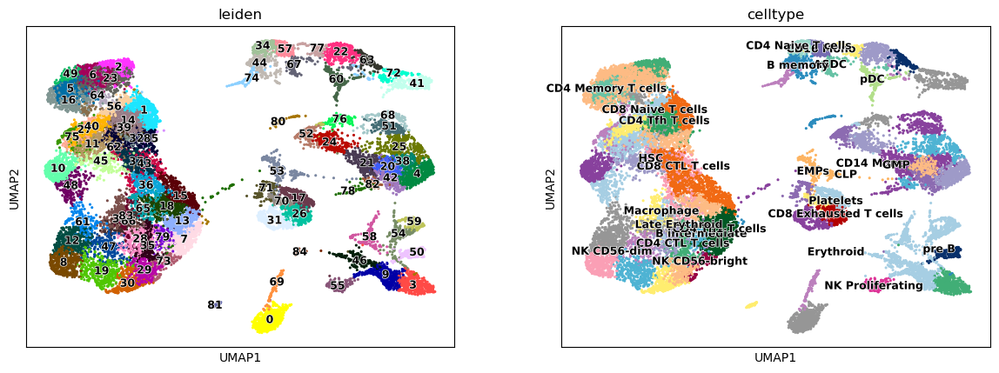

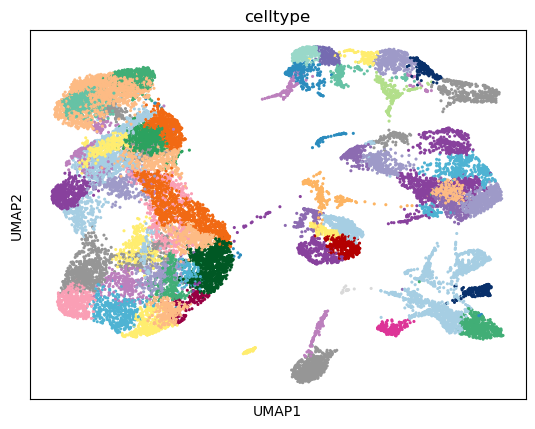

In [ ]:
adata_result.uns['celltype_colors'] = [
    celltype_colors_dict.get(c, "#CCCCCC")  # 若未定义则灰色
    for c in adata_result.obs['celltype'].cat.categories
]

sc.pl.umap(
    adata_result,
    color=['leiden', 'celltype'],
    legend_loc='on data',
    size=20,                    # 点的大小
    legend_fontsize=9,         # 图例字体大小
    # save="_leiden_celltype.pdf",   # 文件名，自动保存在 ./figures/umap_leiden_celltype.pdf
    legend_fontoutline=1
)

# 2) celltype：不显示任何文字图例
sc.pl.umap(
    adata_result,
    color='celltype',
    legend_loc=None,
    size=20
)

In [13]:
adata_result

AnnData object with n_obs × n_vars = 22681 × 27187
    obs: 'prject', 'nUMI', 'nGene', 'cellID', 'Doublet_Score', 'Doublet_Class', 'log10GenesPerUMI', 'mitoRatio', 'riboRatio1', 'riboRatio2', 'riboRatio3', 'riboRatio4', 'riboRatio', 'RNA_snn_res.0', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'class1', 'sample', 'source', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'RNA_snn_res.1.6', 'RNA_snn_res.1.8', 'RNA_snn_res.2', 'cellType', 'dcellType', 'cell', 'patient', 'timing', 'category', 'response', 'sub.response', 'date', 'start', 'daysSinceStart', 'blast', 'age', 'sex', 'FAB', 'cellCount', 'monthsSinceStart', 'relapse', 'daysStartRelapse', 'monthsStartRelapse', 'azimuthNames', 'mut', 'p53.mut', 'n_counts', 'venetoclax', 'treat', 'leiden', 'celltype'
    var: 'vst.mean', 'vst.variance', 'vst.variance.e

In [18]:
# topN_summary.to_csv(f'topN_summary_{treatrment}_{response}.csv')
topN_summary_sub = pd.DataFrame({
    k: {
        "lineage": v["lineage"][0],
        "lineage_score": v["lineage"][1],
        **{
            f"subtype_{i+1}": v["top_subtypes"][i][0] if len(v["top_subtypes"]) > i else None
            for i in range(3)
        },
        **{
            f"subtype_score_{i+1}": v["top_subtypes"][i][1] if len(v["top_subtypes"]) > i else None
            for i in range(3)
        }
    }
    for k, v in cluster_topN.items()
}).T
topN_summary_sub.to_csv(f'topN_summary_sub_{treatrment}_{response}.csv')
cross_tab = pd.crosstab(
    adata_result.obs['leiden'],
    adata_result.obs['celltype'],
    normalize='index'
).round(3)

cross_tab.to_csv(f'leiden_celltype_crosstab_{treatrment}_{response}.csv')


In [7]:
def main_cluster(adata_filter, n_neighbors, embs,resolution,threshold_main,threshold_sub,celltype_colors_dict):
    adata_filter.obsm["X_umap_old"] = adata_filter.obsm["X_umap"].copy()
    for key in ['X_harmony', 'X_pca', 'X_tsne', 'X_pca_harmony', 'X_umap']:
        adata_filter.obsm.pop(key, None)

    Z = adata_filter.obsm[embs]
    Z = Z.toarray() if hasattr(Z, 'toarray') else Z  # 转为 dense

    ho = hm.run_harmony(Z, adata_filter.obs, vars_use=['patient'])
    # harmonypy 返回是 (dims x cells)，所以转置
    adata_filter.obsm[f'{embs}_harmony'] = ho.Z_corr.T

    # sce.pp.harmony_integrate(adata_filter, key="patient", basis=embs)
    sc.pp.neighbors(adata_filter, use_rep=f'{embs}_harmony', n_neighbors=n_neighbors)
    sc.tl.umap(adata_filter, init_pos=adata_filter.obsm["X_umap_old"], random_state=0)

    # sc.tl.umap(adata_filter, random_state=0)
    sc.tl.leiden(adata_filter, resolution=resolution)
    # ari3 = adjusted_rand_score(adata_filter.obs["dcellType"], adata_pre.obs["leiden"])
    # print("Harmony on embedding ARI:", ari3)
    cluster_annotations = {}
    cluster_topN = {}

    sc.tl.rank_genes_groups(adata_filter, 'leiden', method='wilcoxon')

    cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()
    cluster_means = (cluster_means - cluster_means.mean()) / cluster_means.std()
    for cluster in cluster_means.index:
        lineage_scores = {}
        
        # ---- broad lineage ----
        for lineage, info in hierarchical_markers.items():
            general_markers = [g for g in info["general"] if g in cluster_means.columns]
            if not general_markers:
                continue
            lineage_scores[lineage] = cluster_means.loc[cluster, general_markers].mean()
        
        if not lineage_scores:
            cluster_annotations[cluster] = "Unknown"
            continue
        best_lineage, best_lineage_score = max(lineage_scores.items(), key=lambda x: x[1])
        
        if best_lineage_score < threshold_main:
            cluster_annotations[cluster] = "Unknown"
            continue
        
        # ---- sub ----
        subtype_scores = {}
        subtypes = hierarchical_markers[best_lineage]["subtypes"]
        
        if subtypes:
            for subtype, markers in subtypes.items():
                markers_in_data = [g for g in markers if g in cluster_means.columns]
                if not markers_in_data:
                    continue
                subtype_scores[subtype] = cluster_means.loc[cluster, markers_in_data].mean()
        
        if not subtype_scores:
            cluster_annotations[cluster] = best_lineage
        else:
            best_subtype, best_sub_score = max(subtype_scores.items(), key=lambda x: x[1])
            if best_sub_score >= threshold_sub:
                cluster_annotations[cluster] = best_subtype
            else:
                cluster_annotations[cluster] = best_lineage
        
        cluster_topN[cluster] = {
            "lineage": (best_lineage, best_lineage_score),
            "lineage_scores": lineage_scores,  
            "top_subtypes": sorted(subtype_scores.items(), key=lambda x: x[1], reverse=True)[:3]
    }

    adata_filter.obs['celltype'] = adata_filter.obs['leiden'].map(cluster_annotations)
    adata_filter.obs['celltype'] = adata_filter.obs['celltype'].astype('category')
    # adata_filter.uns['celltype_colors'] = [
    #     celltype_colors_dict.get(c, "#CCCCCC")  
    #     for c in adata_filter.obs['celltype'].cat.categories
    #     ]
    topN_summary = pd.DataFrame({
        k: {
            **{
                f"main_type_{i+1}": sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)[i][0]
                if len(v["lineage_scores"]) > i else None
                for i in range(3)
            },
            **{
                f"main_score_{i+1}": sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)[i][1]
                if len(v["lineage_scores"]) > i else None
                for i in range(3)
            }
        }
        for k, v in cluster_topN.items()
    }).T

    return adata_filter, cluster_topN, topN_summary 

In [8]:
adata_ctrl

AnnData object with n_obs × n_vars = 22681 × 27187
    obs: 'prject', 'nUMI', 'nGene', 'cellID', 'Doublet_Score', 'Doublet_Class', 'log10GenesPerUMI', 'mitoRatio', 'riboRatio1', 'riboRatio2', 'riboRatio3', 'riboRatio4', 'riboRatio', 'RNA_snn_res.0', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'class1', 'sample', 'source', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'RNA_snn_res.1.6', 'RNA_snn_res.1.8', 'RNA_snn_res.2', 'cellType', 'dcellType', 'cell', 'patient', 'timing', 'category', 'response', 'sub.response', 'date', 'start', 'daysSinceStart', 'blast', 'age', 'sex', 'FAB', 'cellCount', 'monthsSinceStart', 'relapse', 'daysStartRelapse', 'monthsStartRelapse', 'azimuthNames', 'mut', 'p53.mut', 'n_counts', 'venetoclax', 'treat'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.varianc

In [9]:
response = 'hc' #'responder''nonresponder'
treatrment = 'all' # 'pre' 'post'
adata_filter = adata_ctrl.copy()
# adata_filter = adata_aml
# adata_filter = adata_aml[adata_aml.obs['treat'] == treatrment].copy()
# adata_filter = adata_filter[adata_filter.obs['venetoclax'] == response].copy()
embs="X_FTHCembedding_V1-10M" #"X_FTHCembedding_V1-10M", "X_FTembedding_V1-10M"
n_neighbors = 10
resolution = 5.0
threshold_main = 0.5
threshold_sub = 0.5

adata_result, cluster_topN, topN_summary  = main_cluster(adata_filter, n_neighbors,embs, resolution,threshold_main,threshold_sub,celltype_colors_dict)

2025-10-31 00:38:51,556 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-10-31 00:38:58,336 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-10-31 00:38:58,416 - harmonypy - INFO - Iteration 1 of 10
2025-10-31 00:39:04,066 - harmonypy - INFO - Iteration 2 of 10
2025-10-31 00:39:09,395 - harmonypy - INFO - Iteration 3 of 10
2025-10-31 00:39:14,710 - harmonypy - INFO - Iteration 4 of 10
2025-10-31 00:39:20,087 - harmonypy - INFO - Converged after 4 iterations
/home/administration/miniforge3/envs/dl/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_10399/665695632.py:18: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  

In [12]:
adata_ctrl

AnnData object with n_obs × n_vars = 22681 × 27187
    obs: 'prject', 'nUMI', 'nGene', 'cellID', 'Doublet_Score', 'Doublet_Class', 'log10GenesPerUMI', 'mitoRatio', 'riboRatio1', 'riboRatio2', 'riboRatio3', 'riboRatio4', 'riboRatio', 'RNA_snn_res.0', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'class1', 'sample', 'source', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'RNA_snn_res.1.6', 'RNA_snn_res.1.8', 'RNA_snn_res.2', 'cellType', 'dcellType', 'cell', 'patient', 'timing', 'category', 'response', 'sub.response', 'date', 'start', 'daysSinceStart', 'blast', 'age', 'sex', 'FAB', 'cellCount', 'monthsSinceStart', 'relapse', 'daysStartRelapse', 'monthsStartRelapse', 'azimuthNames', 'mut', 'p53.mut', 'n_counts', 'venetoclax', 'treat'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.varianc

In [20]:
adata_result

AnnData object with n_obs × n_vars = 22681 × 27187
    obs: 'prject', 'nUMI', 'nGene', 'cellID', 'Doublet_Score', 'Doublet_Class', 'log10GenesPerUMI', 'mitoRatio', 'riboRatio1', 'riboRatio2', 'riboRatio3', 'riboRatio4', 'riboRatio', 'RNA_snn_res.0', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'class1', 'sample', 'source', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'RNA_snn_res.1.6', 'RNA_snn_res.1.8', 'RNA_snn_res.2', 'cellType', 'dcellType', 'cell', 'patient', 'timing', 'category', 'response', 'sub.response', 'date', 'start', 'daysSinceStart', 'blast', 'age', 'sex', 'FAB', 'cellCount', 'monthsSinceStart', 'relapse', 'daysStartRelapse', 'monthsStartRelapse', 'azimuthNames', 'mut', 'p53.mut', 'n_counts', 'venetoclax', 'treat', 'leiden', 'celltype'
    var: 'vst.mean', 'vst.variance', 'vst.variance.e

In [13]:
adata_result.obsm["X_umap_old"] = adata_ctrl.obsm["X_umap"].copy()

In [ ]:
old_umap = adata_ctrl.obs["X_umap"].copy() # 先保存旧坐标

# 重建邻居图
sc.pp.neighbors(adata_result, use_rep="X_FTHCembedding_V1-10M_harmony", n_neighbors=15)

# 重算 umap 时使用旧坐标初始化
sc.tl.umap(adata_result, init_pos=old_umap, random_state=0)


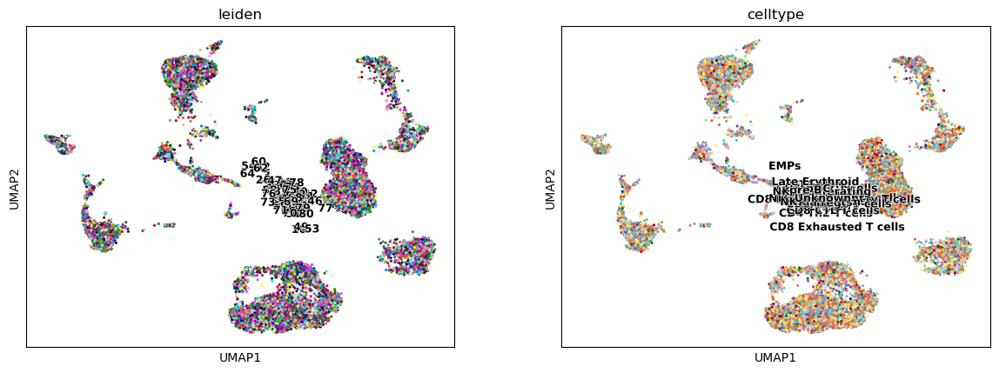

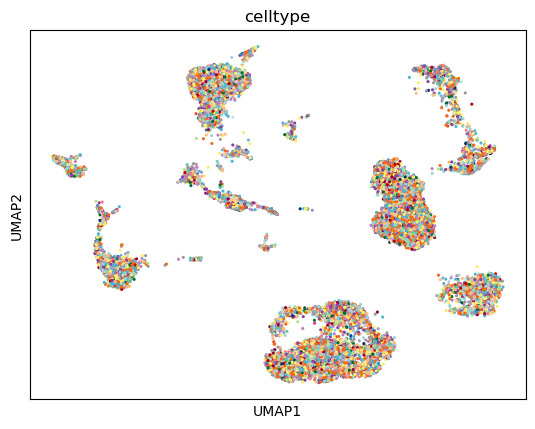

In [22]:
adata_ctrl.obs["celltype"] = adata_result.obs["celltype"].copy()
adata_ctrl.obs["leiden"] = adata_result.obs["leiden"].copy()
adata_ctrl.uns['celltype_colors'] = [
    celltype_colors_dict.get(c, "#CCCCCC")  # 若未定义则灰色
    for c in adata_ctrl.obs['celltype'].cat.categories
]

sc.pl.umap(
    adata_ctrl,
    color=['leiden', 'celltype'],
    legend_loc='on data',
    size=20,                    # 点的大小
    legend_fontsize=9,         # 图例字体大小
    # save="_leiden_celltype.pdf",   # 文件名，自动保存在 ./figures/umap_leiden_celltype.pdf
    legend_fontoutline=1
)

# 2) celltype：不显示任何文字图例
sc.pl.umap(
    adata_ctrl,
    color='celltype',
    legend_loc=None,
    size=20
)

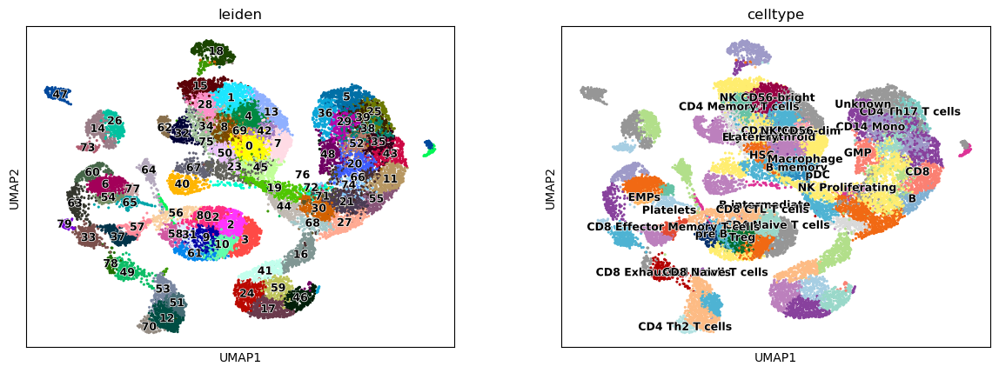

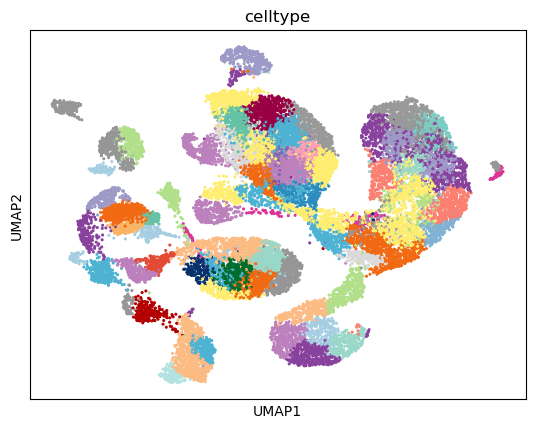

In [17]:
adata_result.uns['celltype_colors'] = [
    celltype_colors_dict.get(c, "#CCCCCC")  # 若未定义则灰色
    for c in adata_result.obs['celltype'].cat.categories
]

sc.pl.umap(
    adata_result,
    color=['leiden', 'celltype'],
    legend_loc='on data',
    size=20,                    # 点的大小
    legend_fontsize=9,         # 图例字体大小
    # save="_leiden_celltype.pdf",   # 文件名，自动保存在 ./figures/umap_leiden_celltype.pdf
    legend_fontoutline=1
)

# 2) celltype：不显示任何文字图例
sc.pl.umap(
    adata_result,
    color='celltype',
    legend_loc=None,
    size=20
)

In [27]:
adata_result

AnnData object with n_obs × n_vars = 22681 × 27187
    obs: 'prject', 'nUMI', 'nGene', 'cellID', 'Doublet_Score', 'Doublet_Class', 'log10GenesPerUMI', 'mitoRatio', 'riboRatio1', 'riboRatio2', 'riboRatio3', 'riboRatio4', 'riboRatio', 'RNA_snn_res.0', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'class1', 'sample', 'source', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'RNA_snn_res.1.6', 'RNA_snn_res.1.8', 'RNA_snn_res.2', 'cellType', 'dcellType', 'cell', 'patient', 'timing', 'category', 'response', 'sub.response', 'date', 'start', 'daysSinceStart', 'blast', 'age', 'sex', 'FAB', 'cellCount', 'monthsSinceStart', 'relapse', 'daysStartRelapse', 'monthsStartRelapse', 'azimuthNames', 'mut', 'p53.mut', 'n_counts', 'venetoclax', 'treat', 'leiden', 'celltype'
    var: 'vst.mean', 'vst.variance', 'vst.variance.e

In [ ]:
import scanpy as sc
import celltypist

# # 查看可用模型
celltypist.models.models_description()

# # 下载并加载模型（返回路径）
# model_path = celltypist.models.download_models('Immune_All_High')

# 1) 逐细胞预测（不做 majority voting）
# adata_ctrl = adata[adata.obs["treat"] == "control"].copy()
pred_ctrl = celltypist.annotate(
    adata_ctrl,
    model='Immune_All_Low.pkl',   # 或你的自训模型路径
    majority_voting=False
)
adata_ctrl.obs['celltypist'] = pred_ctrl.predicted_labels

# pred_aml = celltypist.annotate(
#     adata_aml,
#     model='Immune_All_High',
#     majority_voting=False
# )
# adata_aml.obs['celltypist'] = pred_aml.predicted_labels

# 2) 若想“按簇平滑”，用你自己算的簇来投票（示例）
# sc.pp.normalize_total(adata_aml); sc.pp.log1p(adata_aml)
# sc.pp.highly_variable_genes(adata_aml); sc.tl.pca(adata_aml)
# sc.pp.neighbors(adata_aml); sc.tl.leiden(adata_aml, resolution=1.0)

# # 对每个簇取众数作为簇标签
# cluster_major = (
#     adata_aml.obs.groupby('leiden')['celltypist']
#     .agg(lambda x: x.value_counts().idxmax())
# )
# adata_aml.obs['celltypist_mv'] = adata_aml.obs['leiden'].map(cluster_major)



👉 Detailed model information can be found at `https://www.celltypist.org/models`
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 22681 cells and 27187 genes
🔗 Matching reference genes in the model
🧬 5893 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


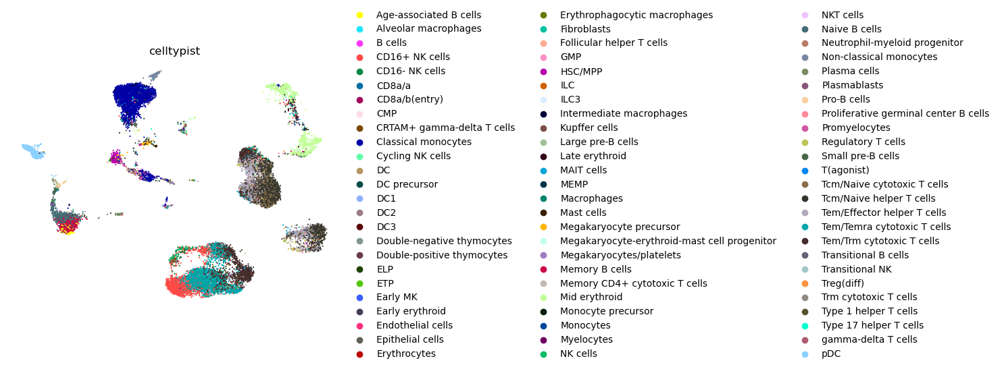

In [ ]:


# if 'X_umap' not in adata_ctrl.obsm_keys():
#     sc.pp.normalize_total(adata_ctrl); sc.pp.log1p(adata_ctrl)
#     sc.pp.highly_variable_genes(adata_ctrl)
#     sc.tl.pca(adata_ctrl); sc.pp.neighbors(adata_ctrl); sc.tl.umap(adata_ctrl)

sc.pl.umap(adata_ctrl, color='celltypist', legend_loc='right margin', frameon=False, s=10)


In [ ]:

# 统计每个 Leiden cluster 中的 celltypist 注释
cluster_celltypes = (
    adata_ctrl.obs.groupby("leiden")["celltypist"]
    .agg(lambda x: x.value_counts().index[0])  # 多数表决
)

print(cluster_celltypes)

adata_ctrl.obs["celltypist_cluster"] = adata_ctrl.obs["leiden"].map(cluster_celltypes)

leiden
0     Tem/Temra cytotoxic T cells
1        Tcm/Naive helper T cells
2             Classical monocytes
3     Tem/Effector helper T cells
4                   Naive B cells
5       Tem/Trm cytotoxic T cells
6        Tcm/Naive helper T cells
7       Tem/Trm cytotoxic T cells
8             Classical monocytes
9                             pDC
10                  Mid erythroid
11                  Mid erythroid
12            Classical monocytes
13        Non-classical monocytes
14              Small pre-B cells
15                        HSC/MPP
16                   Plasma cells
17       Megakaryocytes/platelets
Name: celltypist, dtype: category
Categories (75, object): ['Age-associated B cells', 'Alveolar macrophages', 'B cells', 'CD16+ NK cells', ..., 'Type 1 helper T cells', 'Type 17 helper T cells', 'gamma-delta T cells', 'pDC']


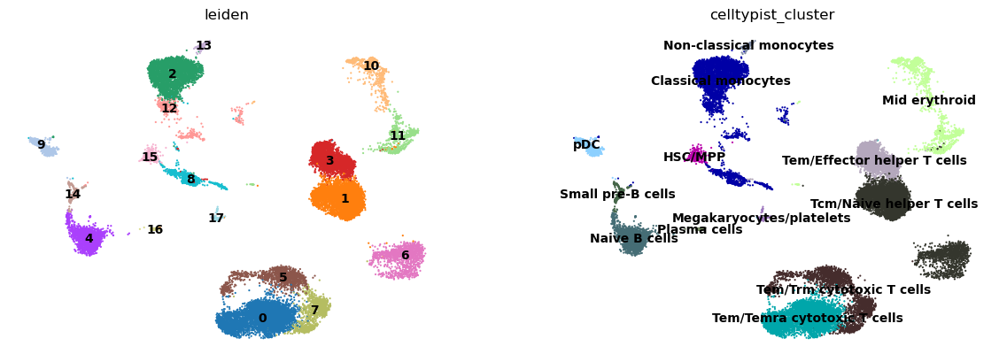

In [ ]:
sc.pl.umap(
    adata_ctrl, 
    color=["leiden", "celltypist_cluster"], 
    legend_loc="on data", 
    frameon=False, 
    s=10
)


In [ ]:

# 统计每个 Leiden cluster 中的 celltypist 注释
cluster_azimuth = (
    adata_ctrl.obs.groupby("leiden")["azimuthNames"]
    .agg(lambda x: x.value_counts().index[0])  # 多数表决
)

print(cluster_azimuth )

adata_ctrl.obs["azimuthNames_cluster"] = adata_ctrl.obs["leiden"].map(cluster_azimuth)

leiden
0     CD8 Effector_2
1         CD4 Memory
2          CD14 Mono
3         CD4 Memory
4            Naive B
5     CD8 Effector_2
6         CD4 Memory
7     CD8 Effector_1
8                GMP
9                pDC
10        Late Eryth
11        Late Eryth
12         CD14 Mono
13         CD16 Mono
14    transitional B
15               HSC
16            Plasma
17          Platelet
Name: azimuthNames, dtype: category
Categories (40, object): ['ASDC', 'BaEoMa', 'CD4 Effector', 'CD4 Memory', ..., 'pre-mDC', 'pre-pDC', 'pro B', 'transitional B']


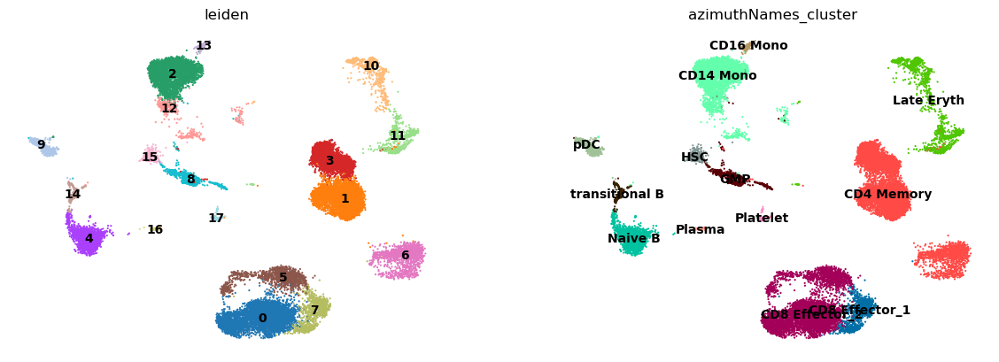

In [ ]:
sc.pl.umap(
    adata_ctrl, 
    color=["leiden", "azimuthNames_cluster"], 
    legend_loc="on data", 
    frameon=False, 
    s=10
)


In [ ]:
cluster_azimuth

leiden
0     CD8 Effector_2
1         CD4 Memory
2          CD14 Mono
3         CD4 Memory
4            Naive B
5     CD8 Effector_2
6         CD4 Memory
7     CD8 Effector_1
8                GMP
9                pDC
10        Late Eryth
11        Late Eryth
12         CD14 Mono
13         CD16 Mono
14    transitional B
15               HSC
16            Plasma
17          Platelet
Name: azimuthNames, dtype: category
Categories (40, object): ['ASDC', 'BaEoMa', 'CD4 Effector', 'CD4 Memory', ..., 'pre-mDC', 'pre-pDC', 'pro B', 'transitional B']